In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader, random_split, TensorDataset
import torchvision.transforms as transforms
import random

In [2]:
# Load dataset
dataset = h5py.File('data/3dshapes.h5', 'r')
print(dataset.keys())
images = dataset['images']  # shape [480000,64,64,3], uint8 in range(256)
labels = dataset['labels']  # shape [480000,6], float64

image_shape = images.shape[1:]  # [64,64,3]
label_shape = labels.shape[1:]  # [6]
n_samples = labels.shape[0]

_FACTORS_IN_ORDER = ['floor_hue', 'wall_hue', 'object_hue', 'scale', 'shape', 'orientation']
_NUM_VALUES_PER_FACTOR = {'floor_hue': 10, 'wall_hue': 10, 'object_hue': 10, 
                          'scale': 8, 'shape': 4, 'orientation': 15}

<KeysViewHDF5 ['images', 'labels']>


In [3]:
# Number of samples to select
n_samples_to_select = 50000
random_indices = np.random.choice(n_samples, n_samples_to_select, replace=False)
random_indices.sort()

sampled_images = images[random_indices]
sampled_labels = labels[random_indices]

In [4]:
normalized_images = sampled_images / 255.0
normalized_images = normalized_images.transpose(0, 3, 1, 2)
print(normalized_images.shape)

(50000, 3, 64, 64)


In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

# FactorVAE Model
class FactorVAE(nn.Module):
    def __init__(self, latent_dim=6):
        super(FactorVAE, self).__init__()
        self.latent_dim = latent_dim
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=4, stride=1, padding=0),
            nn.ReLU(),
        )
        self.fc_mu = nn.Conv2d(256, latent_dim, 1)
        self.fc_logvar = nn.Conv2d(256, latent_dim, 1)

        # Decoder
        self.decoder = nn.Sequential(
            nn.Conv2d(latent_dim, 256, 1),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 256, kernel_size=4, stride=1, padding=0),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def encode(self, x):
        h = self.encoder(x)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar

In [6]:
# Discriminator Network for FactorVAE
# Takes a batch of latent codes and tries to distinguish joint vs factorized samples
class Discriminator(nn.Module):
    def __init__(self, latent_dim=6, hidden_dim=1000):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 2)  # Output logits for 2 classes: joint or factorized
        )

    def forward(self, z):
        # z shape: [B, latent_dim]
        return self.model(z)

In [ ]:
def factor_vae_loss(recon, x, mu, logvar, joint_logits, factorized_logits, gamma=10.0, beta=1.0):
    # Reconstruction loss (BCE)
    bce_per_pixel = F.binary_cross_entropy(recon, x, reduction='none')
    bce_per_image = bce_per_pixel.sum(dim=[1, 2, 3])
    recon_loss = bce_per_image.mean()

    # KL Divergence
    kl_per_image = 0.5 * (torch.exp(logvar) + mu**2 - 1.0 - logvar).sum(dim=1).mean()

    # Total Correlation Approximation
    # TC ≈ E[ joint_logits[:,1] - factorized_logits[:,1] ]
    # Here, joint_logits and factorized_logits are the discriminator outputs for the two classes.
    # The class "1" (for example) can correspond to "joint" and "0" to "factorized". 
    # We want to push the model to minimize this difference, encouraging factorization.
    # The logits for class 1 (joint) minus class 0 (factorized) can approximate the density ratio.
    # According to FactorVAE paper:
    # TC loss = gamma * (D_q - D_factorized), where D_q, D_factorized are the discriminator predictions.
    # We'll use the difference of predicted probabilities (or logits) for classifying as "joint".
    
    # Directly use logits (no softmax)
    joint_logit_diff = joint_logits[:, 1] - joint_logits[:, 0]
    factorized_logit_diff = factorized_logits[:, 1] - factorized_logits[:, 0]
    TC_est = (joint_logit_diff - factorized_logit_diff).mean()
    
    # FactorVAE loss
    loss = recon_loss + beta * kl_per_image + gamma * TC_est

    return loss, recon_loss, kl_per_image, TC_est


def discriminator_loss(joint_logits, factorized_logits):
    # Labels: joint -> 1, factorized -> 0
    # Combine them and run cross entropy on combined output.
    batch_size = joint_logits.size(0)
    labels_joint = torch.ones(batch_size, dtype=torch.long, device=joint_logits.device)
    labels_factor = torch.zeros(batch_size, dtype=torch.long, device=factorized_logits.device)

    # Combine
    logits = torch.cat([joint_logits, factorized_logits], dim=0)
    labels = torch.cat([labels_joint, labels_factor], dim=0)

    # Cross-entropy loss
    d_loss = F.cross_entropy(logits, labels)
    return d_loss


In [23]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Prepare dataset and dataloader
batch_size = 64
tensor_images = torch.tensor(normalized_images, dtype=torch.float32)
dataset = TensorDataset(tensor_images)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)


# Initialize models and optimizers
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = FactorVAE().to(device)
discriminator = Discriminator(latent_dim=6).to(device)

optimizer_vae = optim.Adam(model.parameters(), lr=3e-4)
optimizer_d = optim.Adam(discriminator.parameters(), lr=5e-5)

scheduler_vae = ReduceLROnPlateau(optimizer_vae, mode='min', factor=0.5, patience=2)

previous_lr = scheduler_vae.get_last_lr()

In [ ]:
n_epochs = 15
gamma = 500
beta = 1.0

for epoch in range(n_epochs):
    model.train()
    discriminator.train()
    train_loss = 0
    running_recon_loss = 0
    running_kl_loss = 0
    running_tc_est = 0

    for batch in train_loader:
        images = batch[0].to(device)

        # Forward pass through VAE
        optimizer_vae.zero_grad()
        optimizer_d.zero_grad()

        recon, mu, logvar = model(images)
        z = model.reparameterize(mu, logvar).squeeze(-1).squeeze(-1)  # shape [B, latent_dim]

        # Create factorized samples by permuting each dimension independently
        # Shuffle z along the batch dimension for each dimension:
        batch_size_current = z.size(0)
        z_factorized = []
        for i_dim in range(z.size(1)):
            perm = torch.randperm(batch_size_current, device=device)
            z_factorized.append(z[perm, i_dim])
        z_factorized = torch.stack(z_factorized, dim=1)  # [B, latent_dim]

        # Discriminator forward
        joint_logits = discriminator(z)             # joint samples
        factorized_logits = discriminator(z_factorized)  # factorized samples

        # Update discriminator
        d_loss = discriminator_loss(joint_logits, factorized_logits)
        d_loss.backward(retain_graph=True)
        optimizer_d.step()

        # Now update VAE
        # After discriminator is updated, we recompute loss for VAE
        # We do not need another forward pass, but re-run D for stable code to be safe:
        joint_logits = discriminator(z)
        factorized_logits = discriminator(z_factorized)
        vae_loss, recon_loss, kl_loss, tc_est = factor_vae_loss(recon, images, mu.squeeze(-1).squeeze(-1), logvar.squeeze(-1).squeeze(-1),
                                                                joint_logits, factorized_logits, gamma=gamma, beta=beta)

        optimizer_vae.zero_grad()
        vae_loss.backward()
        optimizer_vae.step()

        train_loss += vae_loss.item()
        running_recon_loss += recon_loss.item()
        running_kl_loss += kl_loss.item()
        running_tc_est += tc_est.item()

    train_loss /= len(train_loader)
    avg_recon_loss = running_recon_loss / len(train_loader)
    avg_kl_loss = running_kl_loss / len(train_loader)
    avg_tc_est = running_tc_est / len(train_loader)

    # Validation loss
    model.eval()
    discriminator.eval()
    val_loss = 0
    with torch.no_grad():
        for batch in val_loader:
            images = batch[0].to(device)
            recon, mu, logvar = model(images)
            z = model.reparameterize(mu, logvar).squeeze(-1).squeeze(-1)

            # Generate factorized samples
            batch_size_current = z.size(0)
            z_factorized = []
            for i_dim in range(z.size(1)):
                perm = torch.randperm(batch_size_current, device=device)
                z_factorized.append(z[perm, i_dim])
            z_factorized = torch.stack(z_factorized, dim=1)

            joint_logits = discriminator(z)
            factorized_logits = discriminator(z_factorized)
            vae_loss, _, _, _ = factor_vae_loss(recon, images, mu.squeeze(-1).squeeze(-1), logvar.squeeze(-1).squeeze(-1),
                                                joint_logits, factorized_logits, gamma=gamma, beta=beta)
            val_loss += vae_loss.item()
    val_loss /= len(val_loader)

    scheduler_vae.step(val_loss)

    print(f"Epoch {epoch+1}/{n_epochs}, Train Loss: {train_loss:.4f}, "
          f"Recon Loss: {avg_recon_loss:.4f}, KL Loss: {avg_kl_loss:.4f}, TC est: {avg_tc_est:.4f}, "
          f"Val Loss: {val_loss:.4f}")

Epoch 1/15, Train Loss: 6497.2371, Recon Loss: 6480.6515, KL Loss: 35.2585, TC est: -0.0373, Val Loss: 5823.5485
Epoch 2/15, Train Loss: 5017.1359, Recon Loss: 4967.8181, KL Loss: 45.2422, TC est: 0.0082, Val Loss: 4437.1652
Epoch 3/15, Train Loss: 4355.5030, Recon Loss: 4286.4145, KL Loss: 35.5816, TC est: 0.0670, Val Loss: 4318.3967
Epoch 4/15, Train Loss: 4188.4235, Recon Loss: 4142.9905, KL Loss: 32.9784, TC est: 0.0249, Val Loss: 4145.7540
Epoch 5/15, Train Loss: 4098.9173, Recon Loss: 4059.6874, KL Loss: 31.7193, TC est: 0.0150, Val Loss: 4088.4667
Epoch 6/15, Train Loss: 4059.7523, Recon Loss: 4023.3555, KL Loss: 30.2751, TC est: 0.0122, Val Loss: 4070.0017
Epoch 7/15, Train Loss: 4018.5292, Recon Loss: 3981.5067, KL Loss: 29.6378, TC est: 0.0148, Val Loss: 3985.1931
Epoch 8/15, Train Loss: 3943.2700, Recon Loss: 3902.1641, KL Loss: 29.7236, TC est: 0.0228, Val Loss: 3916.8214
Epoch 9/15, Train Loss: 3894.2983, Recon Loss: 3853.0325, KL Loss: 29.9963, TC est: 0.0225, Val Loss: 3

In [55]:
# save the trained model and discriminator

torch.save({
    'factorVAE_state_dict': model.state_dict(),
    'discriminator_state_dict': discriminator.state_dict(),
    'optimizer_vae_state_dict': optimizer_vae.state_dict(),
    'optimizer_d_state_dict': optimizer_d.state_dict(),
    'epoch': epoch,
}, "factorVAE_checkpoint.pth")


In [68]:
checkpoint = torch.load("factorVAE_checkpoint.pth", map_location=device)
model.load_state_dict(checkpoint['factorVAE_state_dict'])
discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
optimizer_vae.load_state_dict(checkpoint['optimizer_vae_state_dict'])
optimizer_d.load_state_dict(checkpoint['optimizer_d_state_dict'])
start_epoch = checkpoint['epoch'] + 1

print(f"Checkpoint loaded. Starting from epoch {start_epoch}.")


Checkpoint loaded. Starting from epoch 15.


/var/folders/rz/1vssfdbs6d7cn500zm65qz_00000gn/T/ipykernel_2452/2926766193.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load("factorVAE_checkpoint.

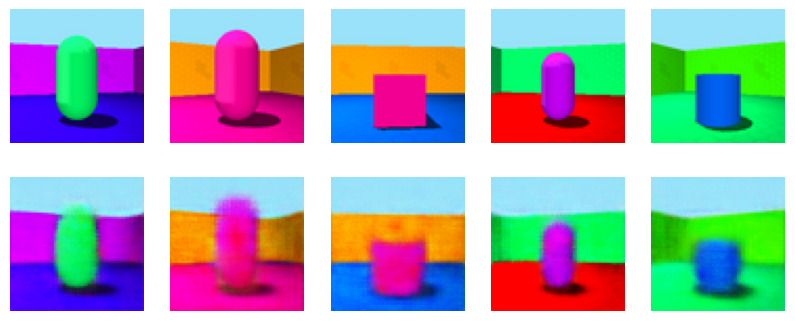

In [72]:
def visualize_reconstruction(model, dataset, n_images=5):
    model.eval()
    indices = random.sample(range(len(dataset)), n_images)
    images = torch.stack([dataset[i][0] for i in indices]).to(device)
    with torch.no_grad():
        reconstructed, _, _, = model(images)  # Unpack only the reconstruction from the output
    
    images = images.cpu().numpy().transpose(0, 2, 3, 1)  # Convert to HWC for visualization
    reconstructed = reconstructed.cpu().numpy().transpose(0, 2, 3, 1)
    
    plt.figure(figsize=(10, 4))
    for i in range(n_images):
        # Original image
        plt.subplot(2, n_images, i+1)
        plt.imshow(images[i])
        plt.axis('off')
        # Reconstructed image
        plt.subplot(2, n_images, i+n_images+1)
        plt.imshow(np.clip(reconstructed[i], 0, 1))  # Ensure valid range
        plt.axis('off')
    plt.show()

# Call visualization function
visualize_reconstruction(model, val_dataset)


In [ ]:
# Compute latent stats

val_images = torch.stack([val_dataset[i][0] for i in range(len(val_dataset))])  # Convert dataset to tensor
val_images = val_images.to(device)

batch = val_images[:1000]  # sample first 1000

model.eval()
with torch.no_grad():
    mu, logvar = model.encode(batch)
    # mu shape: [1000, latent_dim, 1, 1]
    mu = mu.squeeze(-1).squeeze(-1)  # shape [1000, latent_dim]
    mean_z = mu.mean(dim=0)  # shape [latent_dim]
    std_z = mu.std(dim=0)    # shape [latent_dim]

# For each latent dimension, compute variation range as mean ± 1*std
variation_ranges = [(mean_z[i].item() - 1*std_z[i].item(), mean_z[i].item() + 1*std_z[i].item()) 
                    for i in range(model.latent_dim)]

print("Latent dimension variation ranges:")
for i, (low, high) in enumerate(variation_ranges):
    print(f"Dimension {i + 1}: [{low:.4f}, {high:.4f}]")



Latent dimension variation ranges:
Dimension 1: [-1.4353, -0.5439]
Dimension 2: [-0.7380, 0.7140]
Dimension 3: [-1.0440, 1.3159]
Dimension 4: [-0.2916, 0.5313]
Dimension 5: [-1.0842, 1.1861]
Dimension 6: [-1.3908, -0.3597]


In [115]:
def latent_space_traversal(model, n_samples=5, dim_to_vary=0, variation_range=(-3, 3), steps=10):
    """
    Perform latent space traversal by varying a single dimension of the latent space.
    Parameters:
        model: Trained FactorVAE model.
        n_samples: Number of random samples to use.
        dim_to_vary: Latent dimension to vary.
        variation_range: Tuple indicating the range of variation.
        steps: Number of steps in the variation range.
    """
    model.eval()
    variation_values = torch.linspace(variation_range[0], variation_range[1], steps)
    random_indices = np.random.choice(len(val_dataset), n_samples, replace=False)
    images = torch.stack([val_dataset[i][0] for i in random_indices]).to(device)

    with torch.no_grad():
        # Encode images into latent space
        mu, logvar = model.encode(images)
        std = torch.exp(0.5 * logvar)
        encoded = mu  # Use the mean for traversal
        
        # Flatten the latent space for manipulation
        encoded_flat = encoded.view(n_samples, -1)  # Flatten latent space: [n_samples, latent_dim]
        
        # Prepare a canvas for visualization
        plt.figure(figsize=(steps * 2, n_samples * 2))
        
        for i in range(n_samples):
            base_latent = encoded_flat[i].clone()
            
            for j, value in enumerate(variation_values):
                varied_latent = base_latent.clone()
                varied_latent[dim_to_vary] = value
                
                # Reshape and decode the latent vector
                varied_latent_reshaped = varied_latent.view(1, model.latent_dim, 1, 1)  # [1, latent_dim, 1, 1]
                decoded = model.decoder(varied_latent_reshaped)
                decoded_img = decoded.cpu().squeeze(0).permute(1, 2, 0).numpy()
                
                # Plot the resulting image
                plt.subplot(n_samples, steps, i * steps + j + 1)
                plt.imshow(np.clip(decoded_img, 0, 1))  # Clip to valid range [0, 1]
                plt.axis("off")
    
    plt.tight_layout()
    plt.show()

### 1st latent dim encodes orientation (notice how the wall behind changes)

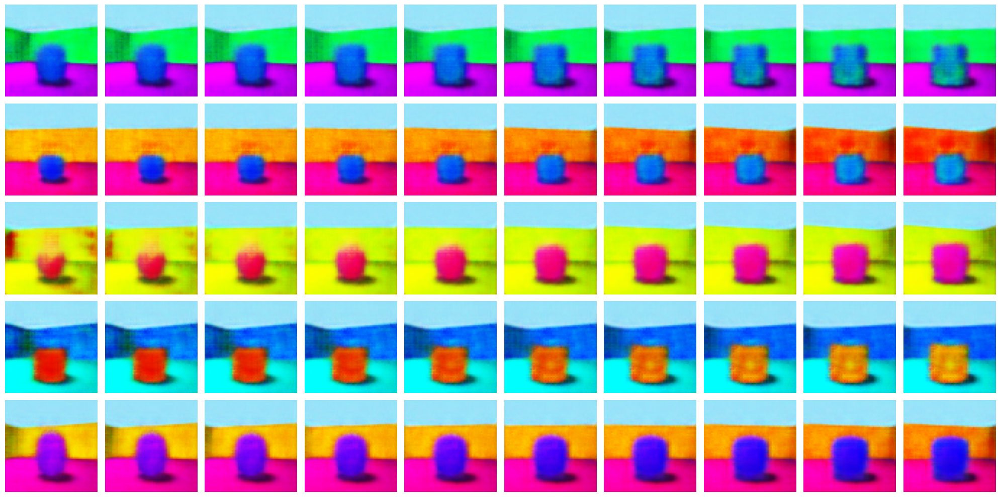

In [94]:
# Perform latent space traversal
latent_space_traversal(model, n_samples=5, dim_to_vary=0, variation_range=variation_ranges[0], steps=10)

### 2nd latent dim encodes object color

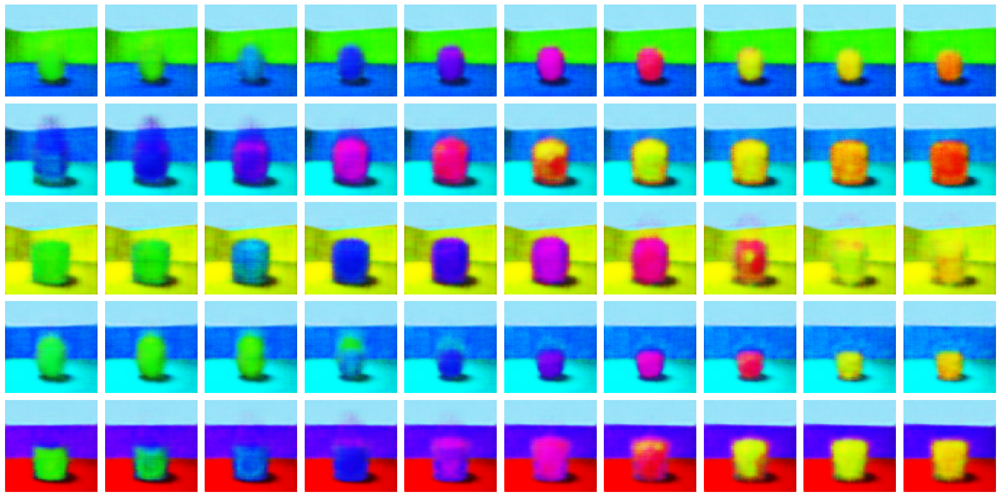

In [116]:
# Perform latent space traversal
latent_space_traversal(model, n_samples=5, dim_to_vary=1, variation_range=variation_ranges[1], steps=10)

### 3rd latent dim encodes floor color

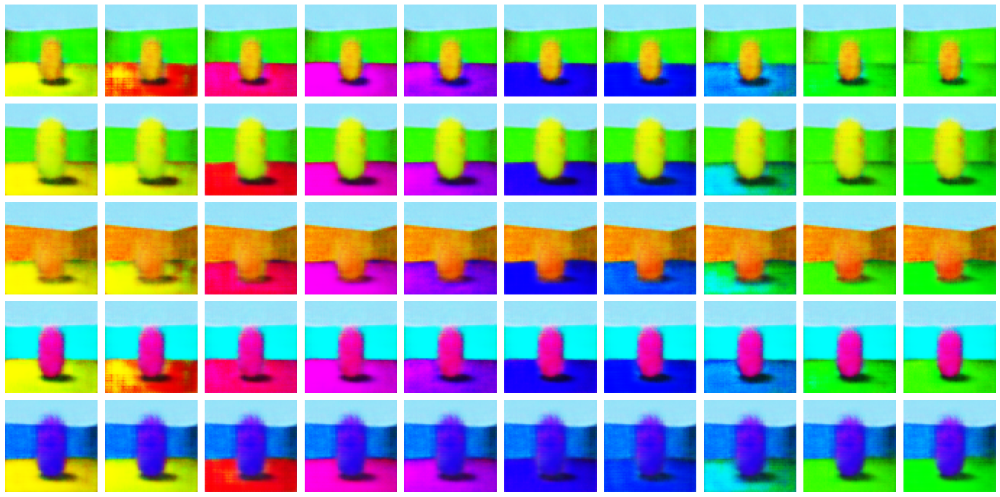

In [117]:
# Perform latent space traversal
latent_space_traversal(model, n_samples=5, dim_to_vary=2, variation_range=variation_ranges[2], steps=10)

### 4th latent dim encodes scale (although with some entanglement with other latent factors)

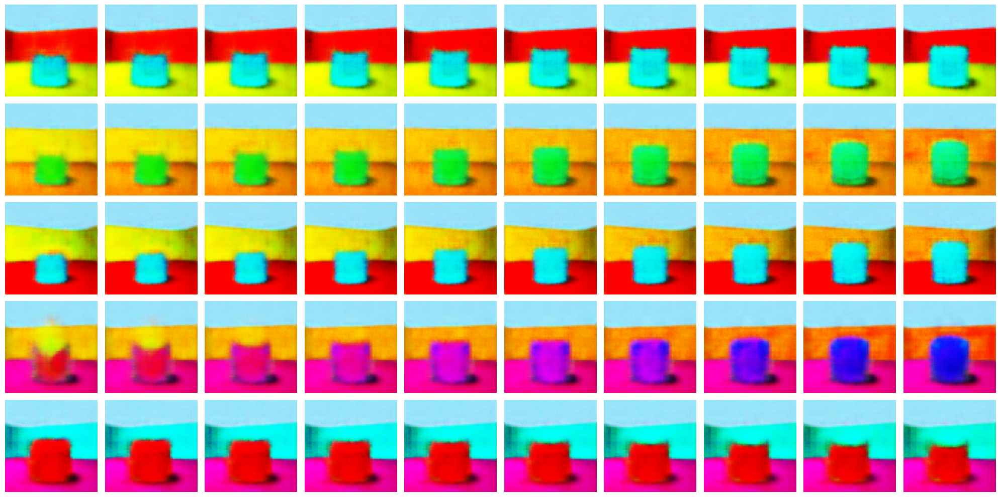

In [119]:
# Perform latent space traversal
latent_space_traversal(model, n_samples=5, dim_to_vary=3, variation_range=variation_ranges[3], steps=10)

### 5th latent dim encodes wall color

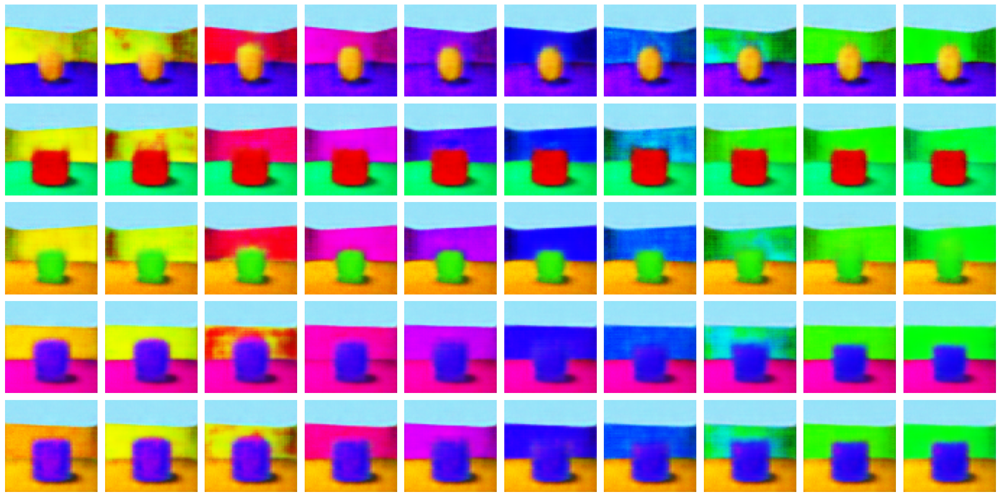

In [120]:
# Perform latent space traversal
latent_space_traversal(model, n_samples=5, dim_to_vary=4, variation_range=variation_ranges[4], steps=10)

### 6th latent dim encodes shape

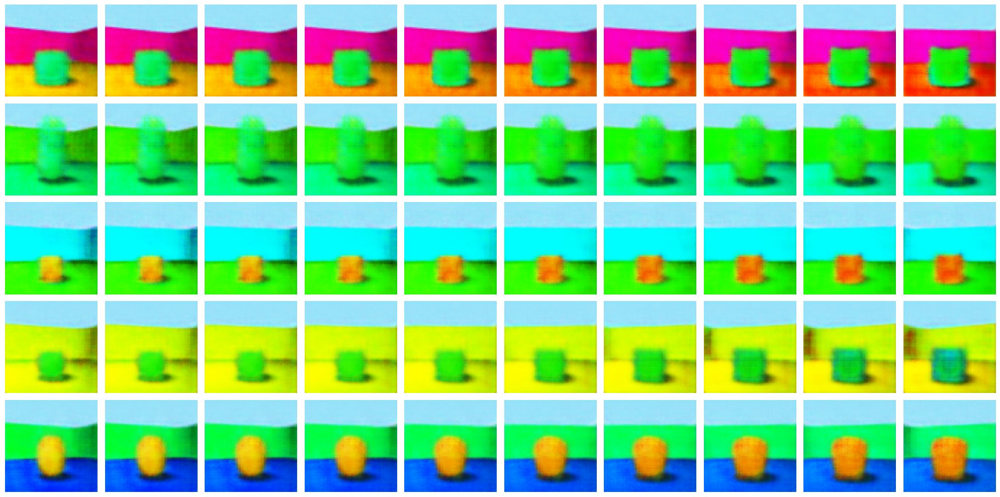

In [124]:
# Perform latent space traversal
latent_space_traversal(model, n_samples=5, dim_to_vary=5, variation_range=variation_ranges[5], steps=10)

In [ ]:
from torchmetrics.image.fid import FrechetInceptionDistance

fid = FrechetInceptionDistance(feature=64).to(device) 

# Compute FID after training:
model.eval()
real_images_list = []
fake_images_list = []

# Gather a subset of real images from the dataset
subset_indices = np.random.choice(len(val_dataset), 1000, replace=False)
real_images_subset = torch.stack([val_dataset[i][0] for i in subset_indices]).to(device)

with torch.no_grad():
    # Get reconstructed images
    reconstructed_images = []
    for i in range(0, len(real_images_subset), batch_size):
        batch = real_images_subset[i:i+batch_size]
        rec, _, _ = model(batch)
        reconstructed_images.append(rec.cpu())
    reconstructed_images = torch.cat(reconstructed_images, dim=0)

# Ensure real images are scaled to [0, 255] and converted to uint8
real_images_subset = (real_images_subset * 255).clamp(0, 255).byte()

# Ensure reconstructed images are scaled to [0, 255] and converted to uint8
reconstructed_images = (reconstructed_images * 255).clamp(0, 255).byte()

# Add real and reconstructed images to FID:
fid.update(real_images_subset.cpu(), real=True)
fid.update(reconstructed_images, real=False)
fid_score = fid.compute().item()
print(f"FID Score: {fid_score:.4f}")


FID Score: 0.0963


In [ ]:
import torch
import numpy as np
import math
import matplotlib.pyplot as plt

model.eval()

# Use a subset of the sampled_images for MIG calculation
n_eval_samples = 10000
if n_eval_samples > sampled_images.shape[0]:
    n_eval_samples = sampled_images.shape[0]
eval_indices = np.random.choice(sampled_images.shape[0], n_eval_samples, replace=False)

eval_images = sampled_images[eval_indices]  # shape: [n_eval_samples, 64, 64, 3] originally
eval_labels = sampled_labels[eval_indices]   # shape: [n_eval_samples, 6]

# Normalize and prepare Torch tensor
eval_images_normalized = eval_images / 255.0
eval_images_normalized = eval_images_normalized.transpose(0, 3, 1, 2)
eval_tensor = torch.tensor(eval_images_normalized, dtype=torch.float32, device=device)

batch_size_eval = 64
eval_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(eval_tensor), 
                                          batch_size=batch_size_eval, shuffle=False)

all_latents = []
with torch.no_grad():
    for batch in eval_loader:
        imgs = batch[0].to(device)
        mu, logvar = model.encode(imgs)
        # Use mu as representation
        z = mu.squeeze(-1).squeeze(-1)  # shape: [B, latent_dim]
        all_latents.append(z.cpu().numpy())

all_latents = np.concatenate(all_latents, axis=0)  # [n_eval_samples, 6]
all_factors = eval_labels  # [n_eval_samples, 6]

print("Latents shape:", all_latents.shape)
print("Factors shape:", all_factors.shape)

# MIG calculation
_FACTORS_IN_ORDER = ['floor_hue', 'wall_hue', 'object_hue', 'scale', 'shape', 'orientation']
_NUM_VALUES_PER_FACTOR = {'floor_hue': 10, 'wall_hue': 10, 'object_hue': 10, 
                          'scale': 8, 'shape': 4, 'orientation': 15}

def discrete_mutual_info(z_discrete, factors):
    # Compute discrete mutual info between each latent dim and each factor
    N, L = z_discrete.shape
    F_ = factors.shape[1]
    MI = np.zeros((L, F_))
    for i in range(L):
        z_vals = z_discrete[:, i]
        for j in range(F_):
            f_vals = factors[:, j]
            # Build joint histogram
            z_unique = np.unique(z_vals)
            f_unique = np.unique(f_vals)
            joint, _, _ = np.histogram2d(z_vals, f_vals, 
                                         bins=(len(z_unique), len(f_unique)))
            joint = joint / joint.sum()
            z_marginal = joint.sum(axis=1, keepdims=True)
            f_marginal = joint.sum(axis=0, keepdims=True)
            epsilon = 1e-12
            numerator = joint + epsilon
            denominator = z_marginal.dot(f_marginal) + epsilon
            MI_ij = (joint * np.log(numerator / denominator)).sum()
            MI[i, j] = MI_ij
    return MI

def compute_mig(latents, factors, num_bins=20):
    # Discretize factors
    disc_factors = []
    factor_cardinalities = []
    for i, factor_name in enumerate(_FACTORS_IN_ORDER):
        unique_vals = np.unique(factors[:, i])
        # Map factor values to integers
        val_to_int = {v: idx for idx, v in enumerate(unique_vals)}
        disc_factors.append(np.array([val_to_int[v] for v in factors[:, i]]))
        factor_cardinalities.append(len(unique_vals))
    disc_factors = np.stack(disc_factors, axis=1)

    # Discretize latents into bins
    z_min = latents.min(axis=0)
    z_max = latents.max(axis=0)
    z_discrete = np.zeros_like(latents, dtype=int)
    for d in range(latents.shape[1]):
        bins = np.linspace(z_min[d], z_max[d], num_bins + 1)
        z_discrete[:, d] = np.digitize(latents[:, d], bins) - 1
    
    MI = discrete_mutual_info(z_discrete, disc_factors)

    # MIG: difference between top two MI scores for each latent / log of factor cardinality
    MIG_list = []
    for l in range(MI.shape[0]):
        sorted_mi = np.sort(MI[l, :])[::-1]
        if len(sorted_mi) < 2:
            continue
        top_factor_index = np.argmax(MI[l, :])
        top_factor_cardinality = factor_cardinalities[top_factor_index]
        mig_l = (sorted_mi[0] - sorted_mi[1]) / math.log(top_factor_cardinality + 1e-12)
        MIG_list.append(mig_l)
    mig_score = np.mean(MIG_list)
    return mig_score

mig_score = compute_mig(all_latents, all_factors, num_bins=20)
print("MIG score:", mig_score)

Latents shape: (10000, 6)
Factors shape: (10000, 6)
MIG score: 0.3681750817325367


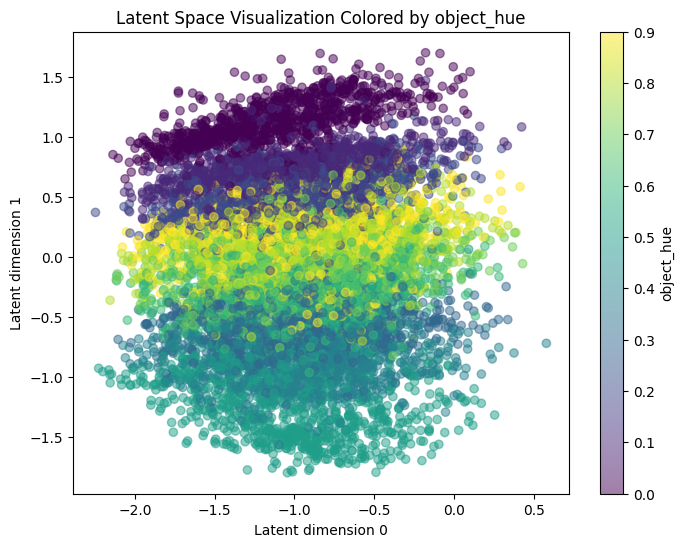

In [147]:
# Visualization Example:
factor_index = 2  # 'object_hue'
factor_values = all_factors[:, factor_index]

dim_x = 0  # e.g., choose dimension 0
dim_y = 1  # e.g., choose dimension 1
latent_x = all_latents[:, dim_x]
latent_y = all_latents[:, dim_y]

plt.figure(figsize=(8,6))
scatter = plt.scatter(latent_x, latent_y, c=factor_values, cmap='viridis', alpha=0.5)
plt.colorbar(scatter, label=_FACTORS_IN_ORDER[factor_index])
plt.xlabel(f"Latent dimension {dim_x}")
plt.ylabel(f"Latent dimension {dim_y}")
plt.title(f"Latent Space Visualization Colored by {_FACTORS_IN_ORDER[factor_index]}")
plt.show()

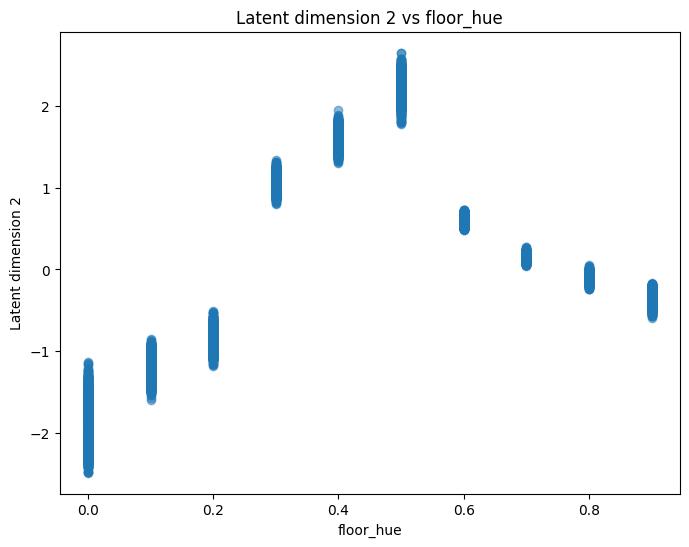

In [138]:
# Visualization Example (one latent dimension vs one factor)
factor_index = 0  # 'object_hue' as an example
factor_values = all_factors[:, factor_index]

dim_x = 2  # Choose a single latent dimension to visualize
latent_x = all_latents[:, dim_x]

plt.figure(figsize=(8,6))
plt.scatter(factor_values, latent_x, alpha=0.5)
plt.xlabel(_FACTORS_IN_ORDER[factor_index])
plt.ylabel(f"Latent dimension {dim_x}")
plt.title(f"Latent dimension {dim_x} vs {_FACTORS_IN_ORDER[factor_index]}")
plt.show()


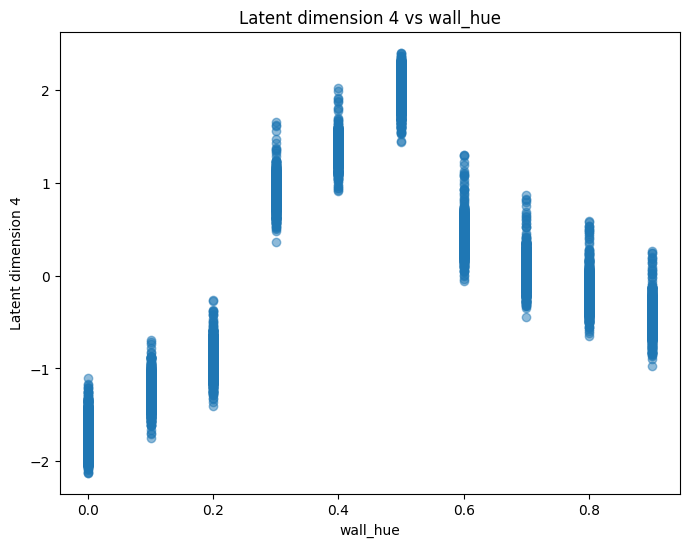

In [139]:
# Visualization Example (one latent dimension vs one factor)
factor_index = 1  # 'object_hue' as an example
factor_values = all_factors[:, factor_index]

dim_x = 4  # Choose a single latent dimension to visualize
latent_x = all_latents[:, dim_x]

plt.figure(figsize=(8,6))
plt.scatter(factor_values, latent_x, alpha=0.5)
plt.xlabel(_FACTORS_IN_ORDER[factor_index])
plt.ylabel(f"Latent dimension {dim_x}")
plt.title(f"Latent dimension {dim_x} vs {_FACTORS_IN_ORDER[factor_index]}")
plt.show()
